<a href="https://colab.research.google.com/github/neha2003-git/kaggle-playground-series/blob/main/Competitions/Dog%20Breed%20Identification/tfk_dog_breed_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐕**End-to-end MultiClass Dog Breed Classification**

This notebook builds an end-to-end multi-class image classifier using `TensorFlow 2.19.0` and `TensorFlow Hub`.

## **Problem**
Identify the dog breed from a given image of a dog.
Goal of the competition is to create a *classifier capable of determining a dog's breed from a photo*.

## **Data**
The data used here is from Kaggle's Dog Breed Identification Competition.

 https://www.kaggle.com/competitions/dog-breed-identification/data/

## **Evaluation**
The evaluation is a file with prediction probabilities for each dog breed of each test image.
The evaluation is based on Multi Class Log Loss between the predicted probability and the observed target.

https://www.kaggle.com/competitions/dog-breed-identification/overview

## **Features**

Some informations about the data:

* Deals with images (unstructured data) so best to use DeepLearning/ TransferLearning.
* 120 breeds of dogs (therefore, there are 120 different classes.)
* There are around 10,200+ images in the training set (with labels)
* There are around 10,400+ images in the testing set (without labels) `Prediction set`


### **Connecting to Kaggle**

In [ ]:
from google.colab import files

In [ ]:
files.upload()

Saving kaggle.json to kaggle (1).json


{'kaggle (1).json': b'{"username":"nehakurian","key":"4fb814bf9d002795af1b4de1166bff94"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle competitions list

ref                                                                                 deadline             category              reward  teamCount  userHasEntered  
----------------------------------------------------------------------------------  -------------------  ---------------  -----------  ---------  --------------  
https://www.kaggle.com/competitions/hull-tactical-market-prediction                 2025-12-15 23:59:00  Featured         100,000 Usd       1754           False  
https://www.kaggle.com/competitions/csiro-biomass                                   2026-01-28 23:59:00  Research          75,000 Usd        570           False  
https://www.kaggle.com/competitions/recodai-luc-scientific-image-forgery-detection  2026-01-15 23:59:00  Research          55,000 Usd        319           False  
https://www.kaggle.com/competitions/MABe-mouse-behavior-detection                   2025-12-15 23:59:00  Research          50,000 Usd        788           False  
https://www.kaggle.com

In [ ]:
!pip install opendatasets

In [ ]:
import opendatasets as od
od.download("https://kaggle.com/competitions/dog-breed-identification")

Skipping, found downloaded files in "./dog-breed-identification" (use force=True to force download)


## **Preparing the tool**
Using `Pandas`, `Matplotlib` and `NumPy` for data anaylsis and manipulation

In [ ]:
!pip install tensorflow tensorflow-hub

In [ ]:
#import all the tools
# Regular EDA (Exploratory Data Anaylsis) and plotting libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
import seaborn as sns

import os
import datetime

#Images
from IPython.display import Image
from tensorflow import keras
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import load_img, img_to_array

%matplotlib inline

#TensorFow & TensorFlowHub
import tensorflow as tf
import tensorflow_hub as hub
import tf_keras as tfk

#Data Processing
from sklearn.model_selection import train_test_split

#Model Evaluation
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import RocCurveDisplay

#Check version
print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)
#Check for GPU Availability
print("GPU", "available (Yeaaahhh!!😁)" if tf.config.list_physical_devices("GPU") else "not available😢")


TF version: 2.19.0
Hub version: 0.16.1
GPU not available😢


## **Data Processing**

**`Turning the images into tensors`**

**File descriptions**

* `train.csv` - the training set, you are provided the breed for these dogs
* `test.csv` - the test set, you must predict the probability of each breed for each image
sample_submission.csv - a sample submission file in the correct format
* `labels.csv` - the breeds for the images in the train set

### **Load the Data**

In [ ]:
#Checking the labels of the data
labels_csv = pd.read_csv("/content/dog-breed-identification/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


In [ ]:
labels_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


In [ ]:
print(labels_csv.breed.unique())

['boston_bull' 'dingo' 'pekinese' 'bluetick' 'golden_retriever'
 'bedlington_terrier' 'borzoi' 'basenji' 'scottish_deerhound'
 'shetland_sheepdog' 'walker_hound' 'maltese_dog' 'norfolk_terrier'
 'african_hunting_dog' 'wire-haired_fox_terrier' 'redbone'
 'lakeland_terrier' 'boxer' 'doberman' 'otterhound' 'standard_schnauzer'
 'irish_water_spaniel' 'black-and-tan_coonhound' 'cairn' 'affenpinscher'
 'labrador_retriever' 'ibizan_hound' 'english_setter' 'weimaraner'
 'giant_schnauzer' 'groenendael' 'dhole' 'toy_poodle' 'border_terrier'
 'tibetan_terrier' 'norwegian_elkhound' 'shih-tzu' 'irish_terrier'
 'kuvasz' 'german_shepherd' 'greater_swiss_mountain_dog' 'basset'
 'australian_terrier' 'schipperke' 'rhodesian_ridgeback' 'irish_setter'
 'appenzeller' 'bloodhound' 'samoyed' 'miniature_schnauzer'
 'brittany_spaniel' 'kelpie' 'papillon' 'border_collie' 'entlebucher'
 'collie' 'malamute' 'welsh_springer_spaniel' 'chihuahua' 'saluki' 'pug'
 'malinois' 'komondor' 'airedale' 'leonberg' 'mexican_h

<Axes: xlabel='breed'>

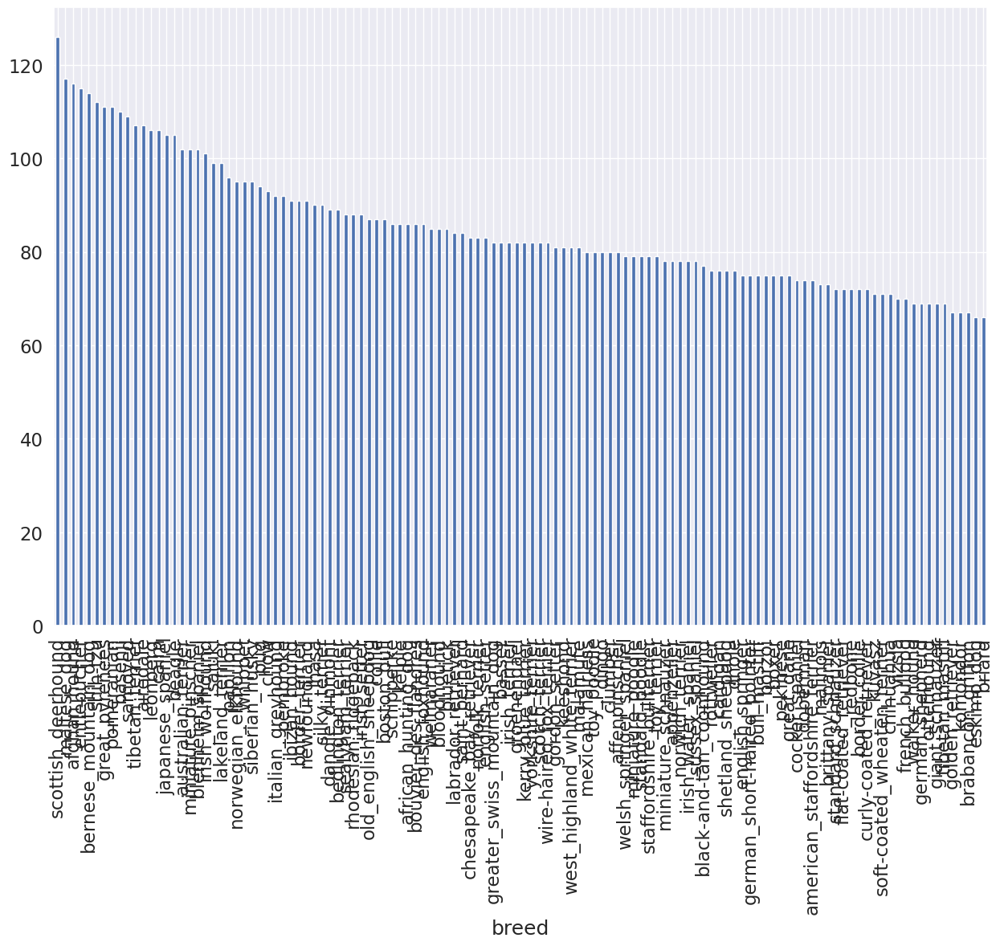

In [ ]:
labels_csv.breed.value_counts().plot(kind="bar", figsize=(15,10))

In [ ]:
print(f"Medium: {labels_csv.breed.value_counts().median()}\nMin: {labels_csv.breed.value_counts().min()}\nMax: {labels_csv.breed.value_counts().max()}")

Medium: 82.0
Min: 66
Max: 126


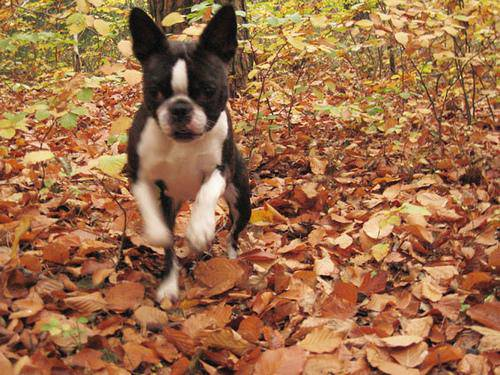

In [ ]:
#View image
Image("/content/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### **Getting Images and their labels**

In [ ]:
#Creating pathnames from image IDs
filenames = ["/content/dog-breed-identification/train/" + fname for fname in labels_csv.id.values + ".jpg"]

filenames[:5]

['/content/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

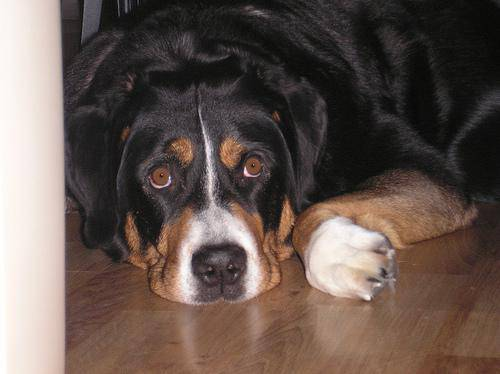

In [ ]:
#Checking the filename
Image(filenames[200])

In [ ]:
labels_csv.breed[200]

'greater_swiss_mountain_dog'

In [ ]:
#Checking the no of data in filename and the no of training images files
folder_path = '/content/dog-breed-identification/train'

file_count = 0
for item in os.listdir(folder_path):
    item_path = os.path.join(folder_path, item)
    if os.path.isfile(item_path):
        file_count += 1

print(f"No of files in train folder: {file_count}\nNo of data in filenames: {len(filenames)}")

No of files in train folder: 10222
No of data in filenames: 10222


In [ ]:
#Checking if filename matches the no of training images files
if len(os.listdir("/content/dog-breed-identification/train/")) == len(filenames):
  print("All the image files match!!👍")
else:
  print("Not all the image files match👎")

All the image files match!!👍


In [ ]:
#Prepare labels

labels = np.array(labels_csv.breed.values)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
#Checking if no of filenames matches the no of labels
if len(filenames) == len(labels):
  print("All the image files match!!👍")
else:
  print("Not all the image files match👎")

All the image files match!!👍


In [ ]:
#Find the unique label values
unique_breeds = np.unique(labels)
print(f" no of unique breeds: {len(unique_breeds)}\n Breed names: {unique_breeds}")

 no of unique breeds: 120
 Breed names: ['affenpinscher' 'afghan_hound' 'african_hunting_dog' 'airedale'
 'american_staffordshire_terrier' 'appenzeller' 'australian_terrier'
 'basenji' 'basset' 'beagle' 'bedlington_terrier' 'bernese_mountain_dog'
 'black-and-tan_coonhound' 'blenheim_spaniel' 'bloodhound' 'bluetick'
 'border_collie' 'border_terrier' 'borzoi' 'boston_bull'
 'bouvier_des_flandres' 'boxer' 'brabancon_griffon' 'briard'
 'brittany_spaniel' 'bull_mastiff' 'cairn' 'cardigan'
 'chesapeake_bay_retriever' 'chihuahua' 'chow' 'clumber' 'cocker_spaniel'
 'collie' 'curly-coated_retriever' 'dandie_dinmont' 'dhole' 'dingo'
 'doberman' 'english_foxhound' 'english_setter' 'english_springer'
 'entlebucher' 'eskimo_dog' 'flat-coated_retriever' 'french_bulldog'
 'german_shepherd' 'german_short-haired_pointer' 'giant_schnauzer'
 'golden_retriever' 'gordon_setter' 'great_dane' 'great_pyrenees'
 'greater_swiss_mountain_dog' 'groenendael' 'ibizan_hound' 'irish_setter'
 'irish_terrier' 'irish_wa

In [ ]:
#Turning labels into boolean value
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

### Creating the Validation set

In [ ]:
#Setup X & y variables
X = filenames
y = boolean_labels

In [ ]:
print(f"No of data in X: {len(X)}\nNo of data in y: {len(y)}")

No of data in X: 10222
No of data in y: 10222


In [ ]:
#Setting the parameter
#Starting off the experiment with ~1000 images and increase as required.

NUM_IMG = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}


In [ ]:
#Splitting the data into train and validation set of total size NUM_IMG
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMG], y[:NUM_IMG], test_size=0.2, random_state=42)

print(f"Images:\nX_train: {len(X_train)}\nX_val: {len(X_val)}\n\nTheir Labels:\ny_train: {len(y_train)}\ny_val: {len(y_val)}")

Images:
X_train: 800
X_val: 200

Their Labels:
y_train: 800
y_val: 200


In [ ]:
#Checking
X_train[:3], y_train[:3]

(['/content/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, Fal

### **Preprocessing Images (Turning images into teensors)**

Creating a function to:
1. Take a image filepath as input
2. Use TensorFlow to read the file and save it to a variable called `img`
3. Turn `img` into Tensors
4. Normalize `img` (convert color channels from 0-225 to 0-1 values)
5. Resize the `img` to be a shape of (224,224)
6. Return the modified `img`

In [ ]:
# Creating the function to load and preprocess data

#Setup image size
IMG_SIZE = 224 #@param {type:"slider", min:128, max:512, step:64}

#Function for preprocessing
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns it into a Tensor.
  """

  #Read the file
  img = tf.io.read_file(image_path)

  #Convert to Tensor with 3 color channels
  img = tf.image.decode_jpeg(img, channels=3)

  #Convert img color channels from 0-225 to 0-1 values
  img = tf.image.convert_image_dtype(img, tf.float32)

  #Resize the image
  img = tf.image.resize(img, size=[img_size, img_size])

  return img


In [ ]:
tensor = process_image(filenames[42])
tensor

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117759],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

### **Turning Data into Batches**

In [ ]:
#Creating a function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  # Find the index of the True value in the boolean label array
  class_id = tf.argmax(label, axis=0)
  label = tf.one_hot(class_id, depth=len(unique_breeds))
  return image, label

In [ ]:
get_image_label(X[42],y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# Create a function to turn data into batches

#Define batch size, default 32
BATCH_SIZE = 32 #@param {type:"integer"}

# Turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image X and label y pairs.
  Shuffles the data if it's the training dataset.
  Also accepts test data (no labels) if present.
  """
  # If the data is a valid dataset, we don't need to label (no y)
  if valid_data:
    print("Creating validation data batches...🎉")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(batch_size)

  # If the data is a test dataset, we don't have label (no y)
  elif test_data:
    print("Creating test data batches...🎉")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(batch_size)

  # If the data is a train dataset, we need to shuffle
  else:
    print(f"Creating training data batches with batch size {batch_size}...🎉")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    # Shuffle pathnames and labels before mapping image processor
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data_batch = data.map(get_image_label).batch(batch_size)

  return data_batch

In [ ]:
#Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches with batch size 32...🎉
Creating validation data batches...🎉


In [ ]:
#Checkout the attributes
print(f"training batches:\n{train_data.element_spec}\n\nvalidation batches:\n{val_data.element_spec}")

training batches:
(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.float32, name=None))

validation batches:
(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.float32, name=None))


### **Visualizing the data**

In [ ]:
#Function for viewing images in a data batch

def show_images(images, labels):
  """
  Displays images from a data batch.
  """
  #Setup the figure
  plt.figure(figsize=(10,10))
  IMG_COUNT = 25 #@param {type:"integer"}

  #Loop through 25 images
  for i in range(IMG_COUNT):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.axis("off")
    plt.title(unique_breeds[labels[i].argmax()])

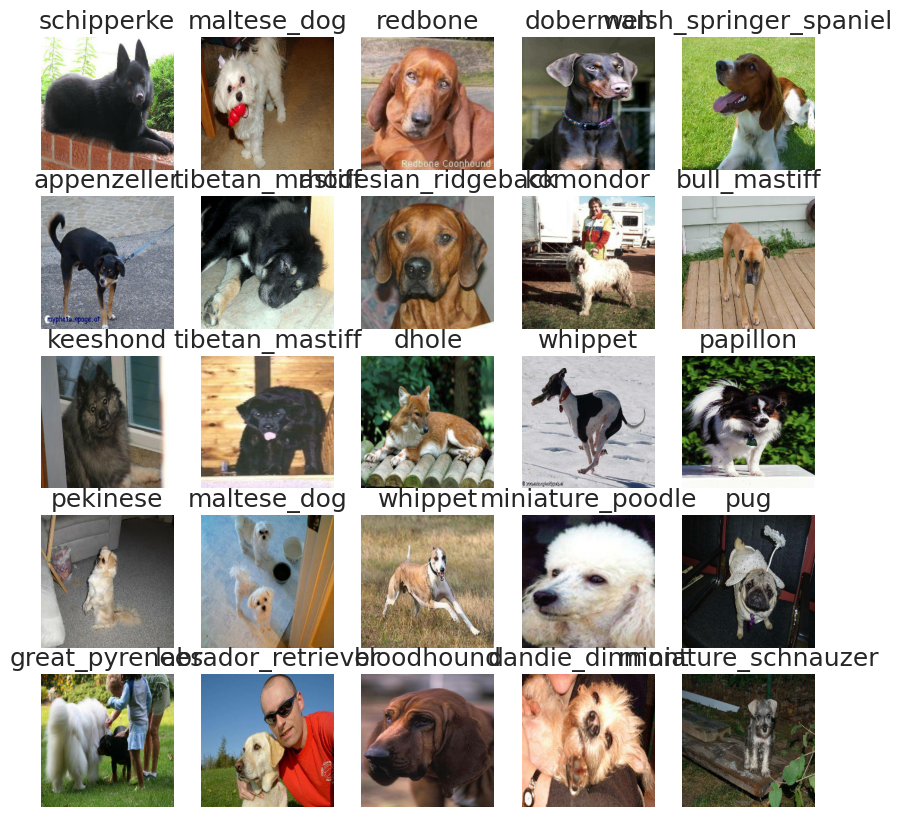

In [ ]:
#Visualizing training batch
train_imgs, train_labels = next(train_data.as_numpy_iterator())
show_images(train_imgs, train_labels)

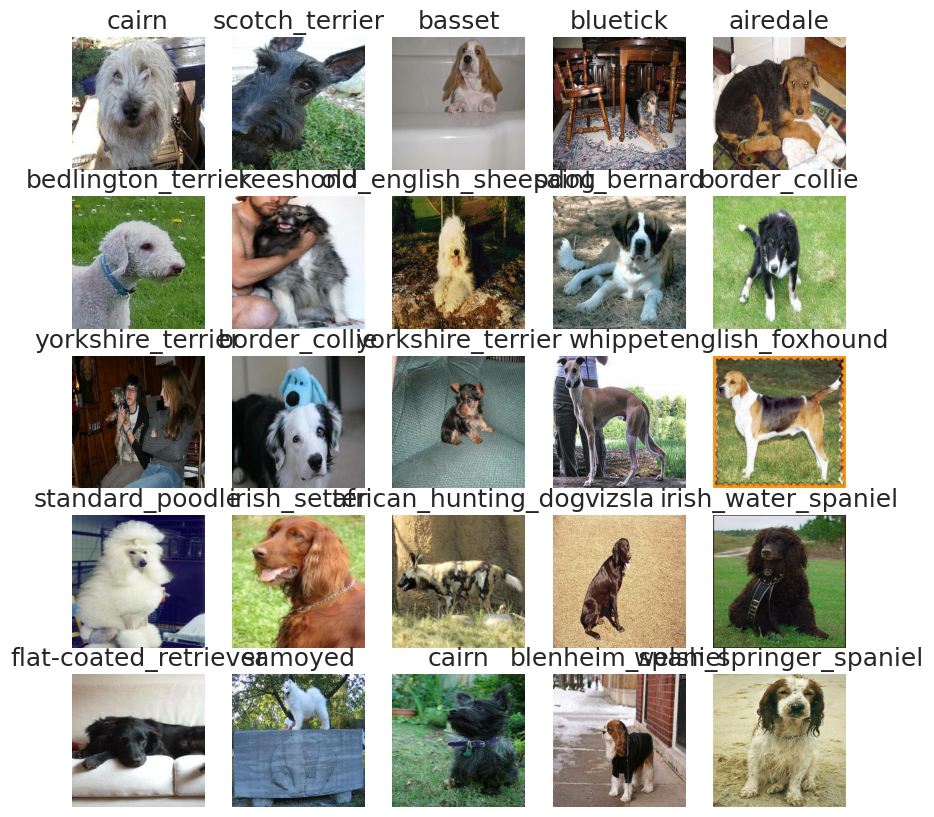

In [ ]:
#Visualizing validation batch
val_imgs, val_labels = next(val_data.as_numpy_iterator())
show_images(val_imgs, val_labels)

## **Building the Model**

Things to Define
* The input shape (image shape in tensors) to the model
* The output shape (image labels in tensors) to the model
* The URL of the model we want to use

In [ ]:
#Setup input shape to model
INPUT_SHAPE = (IMG_SIZE, IMG_SIZE, 3) #batch, height, width, color channels

#Setup output shape of model
OUTPUT_SHAPE = len(unique_breeds) #number of unique labels

#SetUp tensorflow hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-224-classification/2"

**Creating a function, which:**
* Takes the input shape, output shape and the chosen model
* Defines the layers in a Keras model in a sequential fashion
* Complies the model, indicating that evaluation and improvement are necessary.
* Builds the model
* Returns the model


In [ ]:
#Create a function to build a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("🖥️Building model with:", MODEL_URL)

  #Setup the model layers
  model = tfk.Sequential([
      hub.KerasLayer(MODEL_URL,
                     input_shape=input_shape), #the model Layer 1 (input layer)
      tfk.layers.Dense(output_shape,
                       activation="softmax") #Layer 2 (output layer)
  ])

  #Compile the model
  model.compile(
    optimizer='adam',
    loss="categorical_crossentropy",
    metrics = ['accuracy']
  )

  #Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

🖥️Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-224-classification/2
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_3 (KerasLayer)  (None, 1001)              1692489   
                                                                 
 dense_3 (Dense)             (None, 120)               120240    
                                                                 
Total params: 1812729 (6.92 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 1692489 (6.46 MB)
_________________________________________________________________


### **Creating Callbacks**

We gonna create two callbacks,
* for TensorBoard which helps track the model's progress
* for early stopping which prevents model from training for too long

## **TensorBoard Callbacks**

SetUp:
1. Load TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to the model
3. Visualize the model's training logs with the `%tensorboard` magic function.

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
#TensorBoard Callback

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/dog-breed-identification/logs",
                        datetime.datetime.now().strftime("%d-%m-%Y-%H%M%S"))#inorder to track log
  return tfk.callbacks.TensorBoard(log_dir=logdir, histogram_freq=1)

In [ ]:
#Early Stopping Callbacks
early_stopping = tfk.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [ ]:
#Setup Epochs
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:1}


In [ ]:
#Create a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  #Create a model
  model = create_model()

  #Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  #Return the fitted
  return model

In [ ]:
#Fit the model to the data
model = train_model()

🖥️Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-224-classification/2
Epoch 1/100
25/25 [==============================] - 32s 770ms/step - loss: 5.1029 - accuracy: 0.0500 - val_loss: 3.9948 - val_accuracy: 0.1500
Epoch 2/100
25/25 [==============================] - 17s 669ms/step - loss: 1.9251 - accuracy: 0.5375 - val_loss: 3.0214 - val_accuracy: 0.2850
Epoch 3/100
25/25 [==============================] - 16s 641ms/step - loss: 0.8145 - accuracy: 0.8612 - val_loss: 2.7542 - val_accuracy: 0.3550
Epoch 4/100
25/25 [==============================] - 16s 633ms/step - loss: 0.3852 - accuracy: 0.9650 - val_loss: 2.6905 - val_accuracy: 0.3450
Epoch 5/100
25/25 [==============================] - 17s 673ms/step - loss: 0.2174 - accuracy: 0.9950 - val_loss: 2.6592 - val_accuracy: 0.3600
Epoch 6/100
25/25 [==============================] - 17s 704ms/step - loss: 0.1408 - accuracy: 1.0000 - val_loss: 2.6671 - val_accuracy: 0.3450
Epoch 7/100
25/25 [=======

### **Checking the TensorBoard logs**

In [ ]:
%tensorboard --logdir /content/dog-breed-identification/logs

<IPython.core.display.Javascript object>

### **Making & Evaluating Predictions using Training Data**

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.float32, name=None))>

In [ ]:
#Making predictions on validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 5s 578ms/step


array([[5.55897248e-04, 1.24884094e-03, 6.35413016e-06, ...,
        3.47501074e-04, 6.82677468e-03, 1.42636045e-03],
       [5.47049567e-04, 5.52120400e-05, 9.38265584e-03, ...,
        1.06015257e-04, 3.10182331e-05, 1.20512268e-03],
       [5.62537352e-05, 5.39480476e-04, 2.34380968e-06, ...,
        3.86598557e-02, 2.62029134e-05, 1.66776329e-01],
       ...,
       [2.44407033e-06, 1.26815692e-04, 5.03955176e-04, ...,
        1.02407124e-04, 7.22061523e-05, 7.46033096e-04],
       [8.91666044e-04, 1.29322325e-05, 2.14469655e-05, ...,
        1.19636334e-05, 2.80426575e-05, 3.42360901e-04],
       [9.66309744e-05, 1.70187835e-04, 3.02233879e-04, ...,
        1.88720934e-02, 5.98967634e-03, 7.28946121e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[0]

array([5.55897248e-04, 1.24884094e-03, 6.35413016e-06, 7.06285238e-04,
       8.53372112e-05, 1.88605685e-04, 6.40502293e-03, 3.26801201e-05,
       3.30490111e-05, 3.71767164e-05, 1.68269705e-02, 5.09152733e-06,
       6.19120256e-04, 4.63495380e-05, 8.71312805e-05, 1.84137214e-04,
       8.41644578e-05, 8.66297167e-03, 1.55193338e-04, 8.65934055e-07,
       1.71261549e-03, 5.65287655e-06, 4.15842042e-05, 2.86780503e-02,
       1.52817083e-04, 3.15024459e-04, 6.09848462e-02, 1.36729045e-06,
       6.31856528e-05, 4.99221322e-04, 1.61804492e-04, 5.75350365e-03,
       3.48392350e-04, 1.14613469e-03, 7.40417090e-05, 6.22933824e-03,
       1.11059326e-05, 2.95703248e-05, 5.37321648e-05, 1.19398428e-04,
       7.50985369e-03, 4.99746466e-06, 5.75756494e-05, 5.31628684e-05,
       3.50749651e-05, 9.75130533e-05, 2.13634280e-06, 2.74676222e-06,
       1.47554267e-03, 1.01730817e-04, 2.54726474e-04, 4.88357764e-05,
       1.19865239e-02, 1.08363332e-04, 2.91060656e-04, 1.25309700e-04,
      

In [ ]:
#Turning prediction probabilities into their respective label (earier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]


In [ ]:
pred_label = get_pred_label(predictions[40])
pred_label

'labrador_retriever'

In [ ]:
#Creating a function to unbatch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []

  #Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

#Unbatched validation data
val_imgs, val_labels = unbatchify(val_data)

In [ ]:
#Function to plot predicted label, it's probability, true label and respective image
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #Get the pred label
  pred_label = get_pred_label(pred_prob)

  #Color of title to indicate whether it's right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  #Plot image
  plt.imshow(image)
  plt.title(f"Pred: {pred_label} | Prob: {pred_prob[np.argmax(pred_prob)]*100:.0f}% | True: {true_label}".format(),color=color)
  plt.xticks([])
  plt.yticks([])
  plt.show()

In [ ]:
#Function to plots the top 10 highest prediction confidences
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with the truth label for sample n.
  """

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  #Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  #Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")


  #Set the main label
  plt.xlabel("Predictions")
  plt.ylabel("Prediction confidence")
  plt.title(f"Prediction confidence for sample {n}")

  #Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

  plt.show()


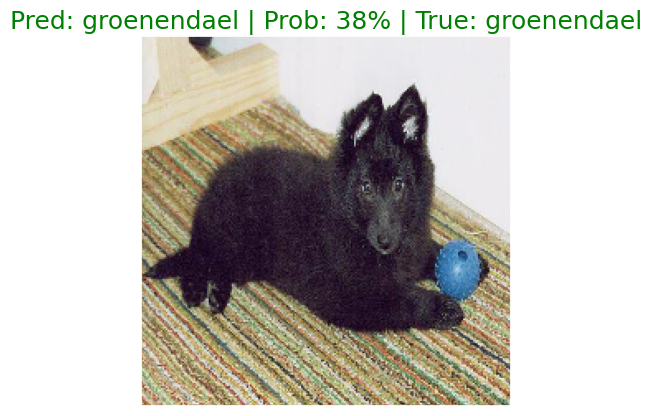

In [ ]:
plot_pred(predictions, labels=val_labels, images=val_imgs, n=77)

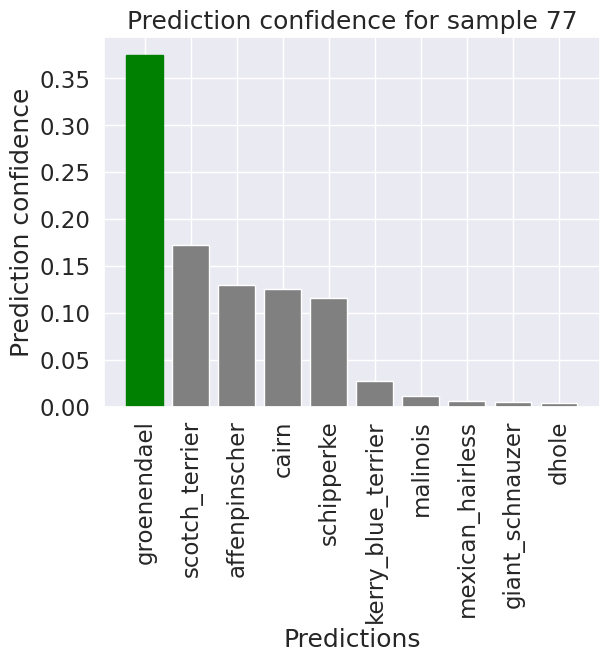

In [ ]:
plot_pred_conf(predictions, labels=val_labels, n=77)

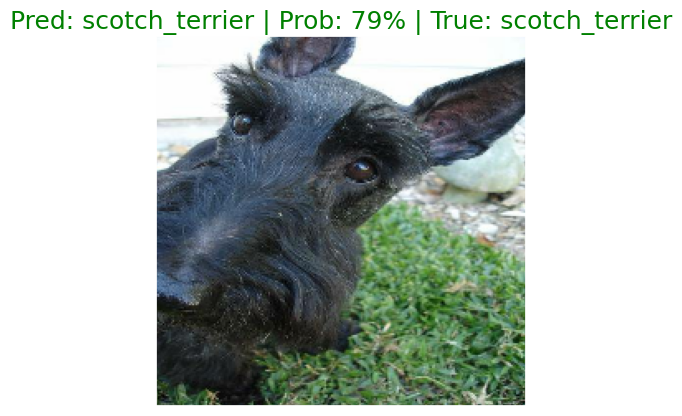

In [ ]:
plot_pred(predictions, labels=val_labels, images=val_imgs, n=1)

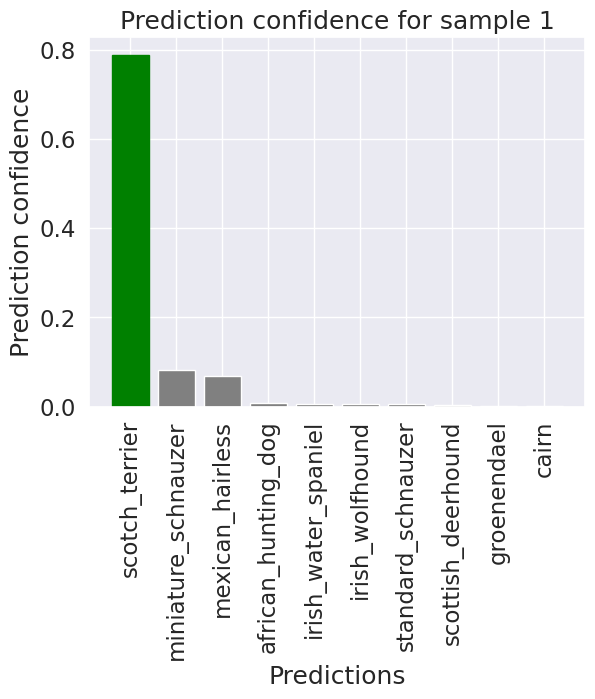

In [ ]:
plot_pred_conf(predictions, labels=val_labels, n=1)

In [ ]:
#Intagreting both ploting functions
def plot_pred_conf_and_label(prediction_probabilities, labels, images):
  i_multiplier = 0
  num_rows = 3
  num_cols = 2
  num_images = num_rows*num_cols
  plt.figure(figsize=(10*num_cols, 5*num_rows))
  for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities, labels, images, n=i+i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities, labels, n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
  plt.show()

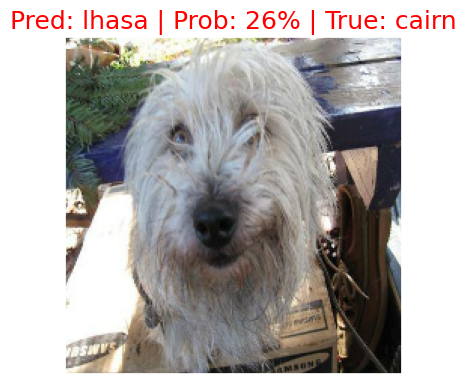

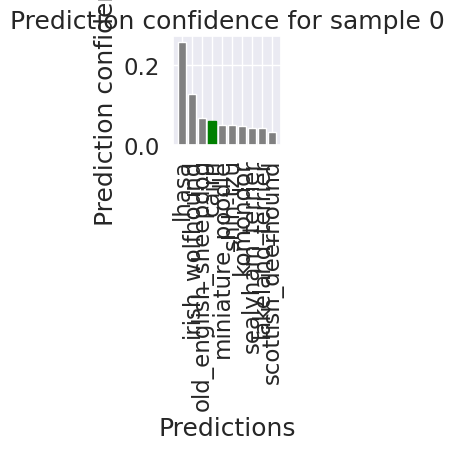

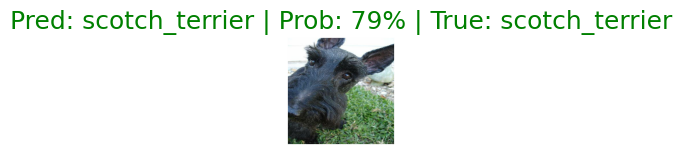

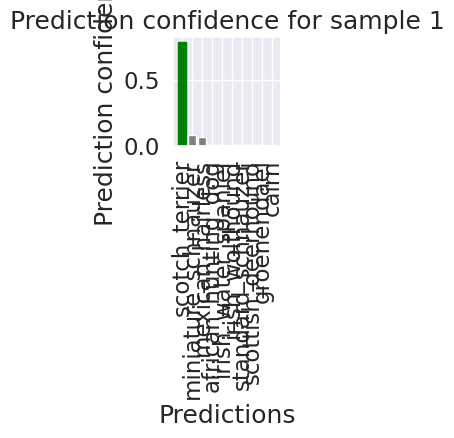

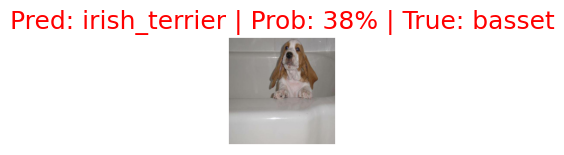

...

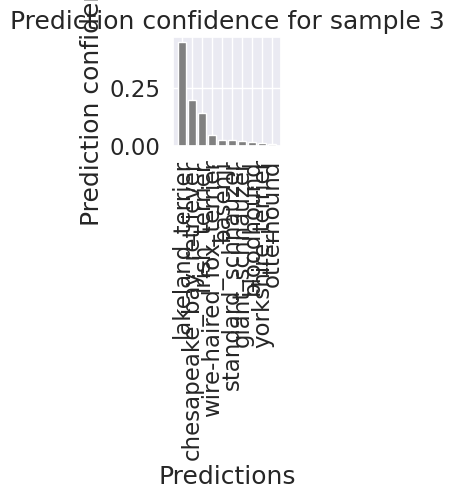

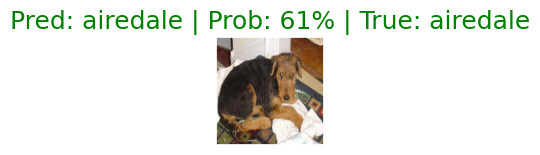

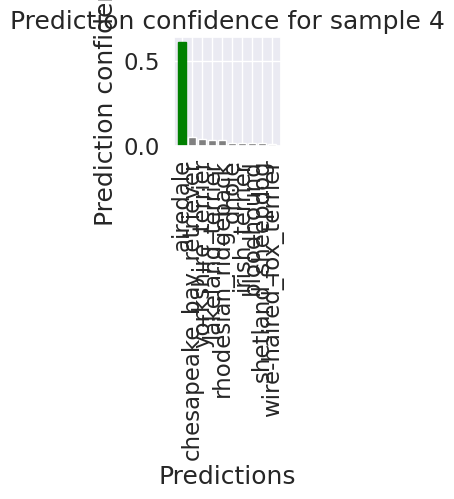

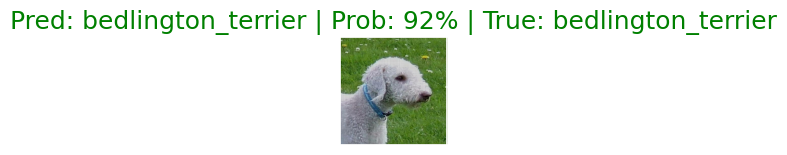

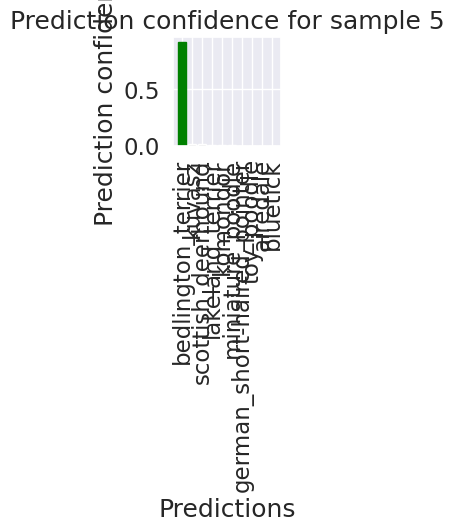

<Figure size 640x480 with 0 Axes>

In [ ]:
plot_pred_conf_and_label(prediction_probabilities= predictions, labels=val_labels, images=val_imgs)

In [ ]:
#Function to save model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  #Create a model directory pathname with current time
  modeldir = os.path.join("/content/dog-breed-identification/models",
                          datetime.datetime.now().strftime("%d-%m-%Y-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5" #save format of model
  print(f"Saving model to: ⬇️{model_path}...")
  model.save(model_path)
  return

In [ ]:
#Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: ⬆️{model_path}...")
  model = tfk.models.load_model(model_path,
                                custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
#Save the model trained on 10000 images
save_model(model, suffix="10000-images-mobilenetv2-Adam")

Saving model to: ⬇️/content/dog-breed-identification/models/04-11-2025-084739-10000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
#Load a trained model
load_10k_img_mod = load_model("/content/dog-breed-identification/models/04-11-2025-075357-10000-images-mobilenetv2-Adam.h5")

Loading saved model from: ⬆️/content/dog-breed-identification/models/04-11-2025-075357-10000-images-mobilenetv2-Adam.h5...


In [ ]:
#Evaluate the loaded model
load_10k_img_mod.evaluate(val_data)

7/7 [==============================] - 3s 323ms/step - loss: 2.7881 - accuracy: 0.3700


[2.7881128787994385, 0.3700000047683716]

## **Training the model on full data**

In [ ]:
print(f"Size of initial training set: {len(X_train), len(y_train)}")
print(f"Size of full training set: {len(X), len(y)}")

Size of initial training set: (800, 800)
Size of full training set: (10222, 10222)


In [ ]:
#Create a data batch with full data
full_data = create_data_batches(X, y)

Creating training data batches with batch size 32...🎉


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.float32, name=None))>

In [ ]:
#Crete a model on full data
full_model = create_model()

🖥️Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-224-classification/2


In [ ]:
#Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

#Call to prevent overfitting
full_model_early_stopping = tfk.callbacks.EarlyStopping(monitor="accuracy",
                                                        patience=3)

In [ ]:
#Fit the model to full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 145s 436ms/step - loss: 2.2048 - accuracy: 0.4464
Epoch 2/100
320/320 [==============================] - 138s 430ms/step - loss: 1.1177 - accuracy: 0.6726
Epoch 3/100
320/320 [==============================] - 133s 416ms/step - loss: 0.8321 - accuracy: 0.7512
Epoch 4/100
320/320 [==============================] - 136s 424ms/step - loss: 0.6459 - accuracy: 0.8042
Epoch 5/100
320/320 [==============================] - 138s 428ms/step - loss: 0.5126 - accuracy: 0.8468
Epoch 6/100
320/320 [==============================] - 139s 434ms/step - loss: 0.4152 - accuracy: 0.8778
Epoch 7/100
320/320 [==============================] - 135s 422ms/step - loss: 0.3368 - accuracy: 0.9044
Epoch 8/100
320/320 [==============================] - 135s 420ms/step - loss: 0.2766 - accuracy: 0.9263
Epoch 9/100
320/320 [==============================] - 134s 420ms/step - loss: 0.2261 - accuracy: 0.9437
Epoch 10/100
320/320 [==============================] -

In [ ]:
save_model(full_model, suffix="full-data-mobilenetv2-Adam")

Saving model to: ⬇️/content/dog-breed-identification/models/04-11-2025-095058-full-data-mobilenetv2-Adam.h5...


/usr/local/lib/python3.12/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
#Load the full model
loaded_full_model = load_model("/content/dog-breed-identification/models/04-11-2025-095058-full-data-mobilenetv2-Adam.h5")

Loading saved model from: ⬆️/content/dog-breed-identification/models/04-11-2025-095058-full-data-mobilenetv2-Adam.h5...


## **Making Predictions on the fully trained model**

### **Preparing Test Data Set**

In [ ]:
#Load test image filenames
test_path = "/content/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:5]

['/content/dog-breed-identification/test/cb7a1afa2a529391169bd6e4deea1234.jpg',
 '/content/dog-breed-identification/test/f8e874d412ff17b33dae7fc7b92f6124.jpg',
 '/content/dog-breed-identification/test/7f68ade61a0147d47c6b134577d265fe.jpg',
 '/content/dog-breed-identification/test/0f92e6a8360ab5dfee99711a55a2a6bf.jpg',
 '/content/dog-breed-identification/test/33fe5015779dc14108b5abe0b5a5ab45.jpg']

In [ ]:
len(test_filenames)

10357

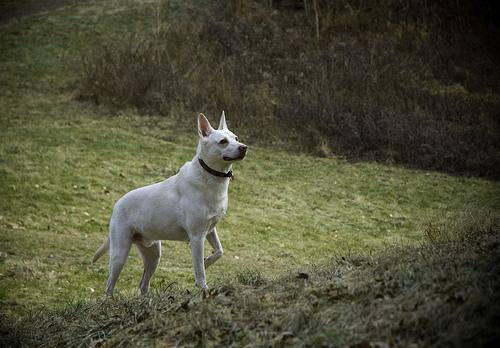

In [ ]:
Image(test_filenames[0])

In [ ]:
#Checking the no of data in filename and the no of training images files
folder_path = '/content/dog-breed-identification/test'

file_count = 0
for item in os.listdir(folder_path):
    item_path = os.path.join(folder_path, item)
    if os.path.isfile(item_path):
        file_count += 1

print(f"No of files in test folder: {file_count}\nNo of data in test_filenames: {len(test_filenames)}")

No of files in test folder: 10357
No of data in test_filenames: 10357


In [ ]:
#Creating test data batches
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...🎉


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

### **Making Predictions**

In [ ]:
#Making Predictions on test batch using loaded fully trained model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 136s 417ms/step


In [ ]:
#Save predicitons (NumPy array) to csv file (for access later)
np.savetxt("/content/dog-breed-identification/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
#Load predicitons (NumPy array) from csv file
test_predictions = np.loadtxt("/content/dog-breed-identification/preds_array.csv", delimiter=",")

In [ ]:
test_predictions.shape

(10357, 120)

### **Preparing test data predictions for Kaggle**

In [ ]:
#Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
preds_df.shape

(0, 121)

In [ ]:
#Append test image IDs to prediction DataFrame
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,cb7a1afa2a529391169bd6e4deea1234,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,f8e874d412ff17b33dae7fc7b92f6124,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,7f68ade61a0147d47c6b134577d265fe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0f92e6a8360ab5dfee99711a55a2a6bf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,33fe5015779dc14108b5abe0b5a5ab45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#Add the predicition probabilies
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,cb7a1afa2a529391169bd6e4deea1234,9.919720e-13,2.058685e-15,4.133665e-07,9.015563e-11,9.076471e-03,2.333003e-05,2.579669e-07,9.277210e-07,1.142731e-09,...,2.194463e-10,1.663922e-04,2.608664e-07,7.662948e-07,3.372947e-05,8.291565e-11,8.107345e-05,6.736299e-01,4.948025e-03,2.282417e-09
1,f8e874d412ff17b33dae7fc7b92f6124,2.063010e-09,1.442638e-20,3.028996e-10,7.418930e-13,2.512150e-05,1.737029e-10,3.971872e-12,1.108892e-07,2.688635e-09,...,3.774610e-14,1.580303e-06,7.553137e-15,2.343748e-11,2.920356e-13,3.073168e-11,3.066648e-13,3.161619e-12,1.607733e-11,2.279150e-12
2,7f68ade61a0147d47c6b134577d265fe,1.732267e-08,6.474419e-04,8.541269e-10,4.026855e-05,7.590393e-09,1.760242e-10,1.288819e-02,4.564534e-11,1.605889e-10,...,4.992824e-08,3.729707e-12,1.028919e-09,4.699898e-11,7.573790e-13,9.363883e-12,8.466456e-08,9.775241e-08,5.342934e-07,4.238790e-06
3,0f92e6a8360ab5dfee99711a55a2a6bf,3.187971e-12,3.455628e-07,2.749219e-09,1.467481e-09,1.164774e-10,3.486492e-13,1.423606e-07,3.270346e-15,4.885680e-08,...,2.744999e-10,4.576786e-12,5.935212e-10,6.858749e-11,3.955044e-11,9.642203e-04,1.329633e-09,6.653679e-14,7.342723e-13,1.742988e-10
4,33fe5015779dc14108b5abe0b5a5ab45,6.342156e-09,1.643441e-11,1.213441e-09,4.280694e-11,3.158166e-09,1.271549e-08,3.595422e-11,1.923352e-08,2.240957e-04,...,3.323016e-11,1.969012e-08,7.648686e-07,5.735251e-06,2.683089e-04,9.636315e-01,2.226722e-07,5.101717e-05,2.989668e-10,1.130494e-09


In [ ]:
preds_df.shape

(10357, 121)

In [ ]:
#Export to csv
preds_df.to_csv("/content/dog-breed-identification/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)